# Plot speed differences 

In [1]:
%matplotlib inline

import cosima_cookbook as cc
import matplotlib.pyplot as plt
import numpy as np
import netCDF4 as nc
import cartopy.crs as ccrs
import xarray as xr
import cmocean.cm as cmocean
import glob
import matplotlib.path as mpath
import matplotlib.colors as col
from netCDF4 import Dataset
import gsw


import logging
logging.captureWarnings(True)
logging.getLogger('py.warnings').setLevel(logging.ERROR)

from dask.distributed import Client

In [2]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/43753/status,
Dashboard: /proxy/43753/status,Workers: 5
Total threads: 20,Total memory: 200.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:37509,Workers: 5
Dashboard: /proxy/43753/status,Total threads: 20
Started: Just now,Total memory: 200.00 GiB
Comm: tcp://127.0.0.1:35817,Total threads: 4
Dashboard: /proxy/45779/status,Memory: 40.00 GiB
Nanny: tcp://127.0.0.1:37763,


In [13]:
# database for control simulation:
session_name = '/g/data/v45/wf4500/databases/gdata_01deg_jra55v13_ryf9091_DSW.db'
master_session = cc.database.create_session(session_name)
control = '01deg_jra55v13_ryf9091_DSW'
#session_name = '/home/156/wf4500/databases/access/DSW.db'
#master_session = cc.database.create_session(session_name)
#control = '01deg_jra55v13_ryf9091_21mbath'

# basal melt experiments
basal_gade = '01deg_jra55v13_ryf9091_DSW_BasalGade_NoIcb'#'accessom2-GPC023'
icb_gade = '01deg_jra55v13_ryf9091_DSW_BasalGade_YesIcb'#'accessom2-GPC026'
basal_nogade = '01deg_jra55v13_ryf9091_DSW_BasalNoGade_NoIcb'

start_time='1909-01-01'
end_time='1910-01-01'

lat_slice = slice(-80,-59)
lon_slice = slice(-280,80)
z_range=[0,500]
z_slice = slice(z_range[0],z_range[1])

In [14]:
# Read in Pedros database. 
#session_name = '/g/data/e14/pc5520/model_data/access-om2/basal_melt_MOM5/basal_melt_MOM5.db'
session_name = '/g/data/ik11/databases/basal_melt_MOM5.db'
basal_melt_session = cc.database.create_session(session_name)

In [20]:
def get_data(expt, session, start_time, end_time):
    lat_slice = slice(-80,-59)
    lon_slice = slice(-280,80)
    z_range=[0,500]
    z_slice = slice(z_range[0],z_range[1])
    time_slice = slice(start_time, end_time)
    
    u = cc.querying.getvar(expt, 'u', session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yu_ocean=lat_slice).sel(xu_ocean=lon_slice).sel(st_ocean=z_slice)
    v = cc.querying.getvar(expt, 'v', session, frequency='1 monthly',
                                   start_time=start_time, end_time=end_time).sel(yu_ocean=lat_slice).sel(xu_ocean=lon_slice).sel(st_ocean=z_slice)
    dzt = cc.querying.getvar(expt, 'dzt', session, frequency='1 monthly',
                                   start_time=start_time, end_time=end_time).sel(yt_ocean=lat_slice).sel(xt_ocean=lon_slice).sel(st_ocean=z_slice)
    
    u = u.sel(time=time_slice)
    v = v.sel(time=time_slice)
    dzt = dzt.sel(time=time_slice)

    return u,v,dzt

def calc_speed(u, v, dzt):
    # reassign dzt coordinates for multiplication
    dzt = dzt.assign_coords({"xt_ocean" : u.xu_ocean.data}).rename(xt_ocean="xu_ocean")
    dzt = dzt.assign_coords({"yt_ocean" : u.isel(yu_ocean=slice(None, -1)).yu_ocean.data}).rename(yt_ocean="yu_ocean")

    # calculate speed
    spd = np.sqrt(u**2 + v**2)
    spd_ave = (spd.isel(yu_ocean=slice(None, -1))*(dzt/dzt.sum(dim='st_ocean'))).sum(dim='st_ocean')
    spd_ave = spd_ave.mean(dim='time').load()

    return spd_ave


In [23]:
%%time
# read in temperature and salinity variables and calculate depth-averaged speed
u_cntl, v_cntl, dzt_cntl = get_data(control, master_session, start_time, end_time)
spd_cntl = calc_speed(u_cntl, v_cntl, dzt_cntl)

u_basal, v_basal, dzt_basal = get_data(basal_gade, basal_melt_session, start_time, end_time)
spd_basal = calc_speed(u_basal, v_basal, dzt_basal)

u_icb, v_icb, dzt_icb = get_data(icb_gade, basal_melt_session, start_time, end_time)
spd_icb = calc_speed(u_icb, v_icb, dzt_icb)

u_basalNoGade, v_basalNoGade, dzt_basalNoGade = get_data(basal_nogade, basal_melt_session, start_time, end_time)
spd_basalNoGade = calc_speed(u_basalNoGade, v_basalNoGade, dzt_basalNoGade)

CPU times: user 3min 1s, sys: 6.41 s, total: 3min 7s
Wall time: 3min 26s


In [34]:
%%time
# now calculate anomalies
spd_basal_minus_cntl = spd_basal - spd_cntl
spd_basal_minus_cntl  = spd_basal_minus_cntl.where(spd_basal_minus_cntl != 0.)
spd_icb_minus_cntl = spd_icb - spd_cntl
spd_icb_minus_cntl  = spd_icb_minus_cntl.where(spd_icb_minus_cntl != 0.)
spd_basalNoGade_minus_cntl = spd_basalNoGade - spd_cntl
spd_basalNoGade_minus_cntl  = spd_basalNoGade_minus_cntl.where(spd_basalNoGade_minus_cntl != 0.)

CPU times: user 28.7 ms, sys: 0 ns, total: 28.7 ms
Wall time: 24.1 ms


In [36]:
fontsize=16
subplot_titles = ['Basal (GPC023) - CNTL',
                  'ICB (GPC026) - CNTL',
                  'Basal No Gade (GPC029) - CNTL',
                 ]
subplot_labels = ['a)','b)','c)',]

# topography data for plotting:
data_path = '/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091/'
htfile = data_path + 'output196/ocean/ocean_grid.nc'
ht = xr.open_dataset(htfile).ht.sel(yt_ocean=slice(-90,-55)).load()
land_mask = np.squeeze(ht.values)*0
land_mask[np.isnan(land_mask)] = 1
land_mask = np.where(land_mask==1,land_mask,np.nan)
land_mask_masked = np.ma.masked_where((land_mask==0),land_mask)
# make land go all the way to -90S:
land_mask_lat = ht.yt_ocean.values
land_mask_lat[0] = -90

# define circle 
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)

def map_elements(axes):
    for i, ax in enumerate(axes.flatten()):
        ax.set_boundary(circle, transform=ax.transAxes)
        ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000],colors='k',linewidths=0.6,transform = ccrs.PlateCarree())
        ax.set_extent([-280, 80, -90, -61], ccrs.PlateCarree())
        ax.text(0.08, 0.95, subplot_labels[i],fontsize=20, fontweight='bold',transform = ax.transAxes)
        ax.set_title(subplot_titles[i],fontsize=16, )
        
def plot_colorbar(fig,axes_loc,cb_item,label):
    cbaxes = fig.add_axes(axes_loc)
    cbar = plt.colorbar(cb_item, cax = cbaxes, orientation = 'vertical',extend = 'max', shrink=0.5)
    cbar.set_label(label,fontsize=fontsize,labelpad=2)
    cbar.ax.tick_params(labelsize=14)
    return cbar
def plot_anom_colorbar(fig,axes_loc,cb_item,label):
    cbaxes = fig.add_axes(axes_loc)
    cbar = plt.colorbar(cb_item, cax = cbaxes, orientation = 'vertical',extend = 'both', shrink=0.5)
    cbar.set_label(label,fontsize=fontsize,labelpad=2)
    cbar.ax.tick_params(labelsize=14)
    return cbar


def figure_spd_zrange(z_range,anom_spd1,anom_spd2,anom_spd3):
    plt.rcParams['font.size'] = 16
    fig,axes = plt.subplots(1,3,figsize=(18,6),subplot_kw={'projection': ccrs.SouthPolarStereo()})
    plt.subplots_adjust(wspace=0.02, hspace=0.01)
    map_elements(axes)
    vminS, vmaxS = 0, 0.2
    vminA, vmaxA = -0.05, 0.05
    cmapS, cmapA = cmocean.speed, cmocean.delta_r
    
    for i, ax in enumerate(axes.flatten()):
        ax.text(0.55, 0.5, f'{z_range[0]}-{z_range[1]}m', ha='center', va='center', transform = ax.transAxes)
    # plot control anomalies
    axes[0].pcolormesh(anom_spd1.xu_ocean, anom_spd1.yu_ocean, anom_spd1,
                   cmap = cmapA, vmin=vminA, vmax=vmaxA, 
                   transform = ccrs.PlateCarree())
    cb_anom = axes[1].pcolormesh(anom_spd2.xu_ocean, anom_spd2.yu_ocean, anom_spd2,
                   cmap = cmapA, vmin=vminA, vmax=vmaxA, 
                   transform = ccrs.PlateCarree())
    axes[2].pcolormesh(anom_spd3.xu_ocean, anom_spd3.yu_ocean, anom_spd3,
                   cmap = cmapA, vmin=vminA, vmax=vmaxA, 
                   transform = ccrs.PlateCarree())
    plot_anom_colorbar(fig,[0.91, 0.2, 0.012, 0.6],cb_anom,'$\Delta$ speed (m/s)')
    
    return fig, axes


Plot speed. 

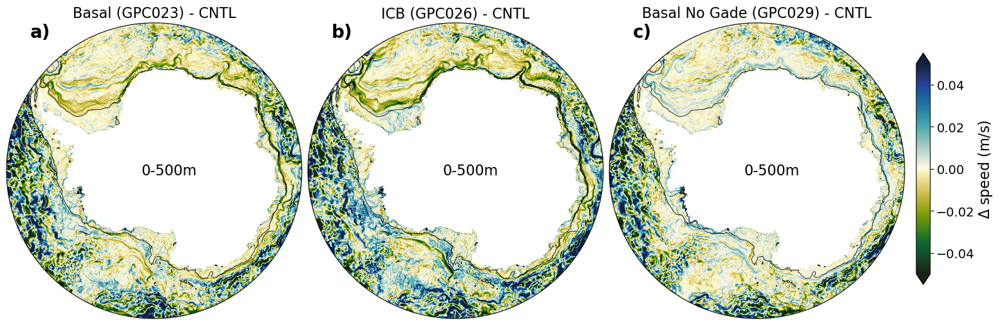

In [35]:
fig, axes = figure_spd_zrange(z_range,spd_basal_minus_cntl,spd_icb_minus_cntl, spd_basalNoGade_minus_cntl)


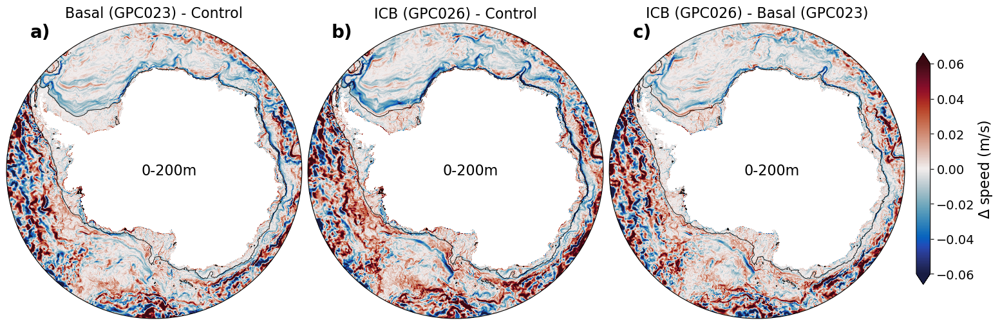

In [82]:
fig, axes = figure_spd_zrange(z_range,spd_TGade_minus_cntl,spd_TGadeICB_minus_cntl, spd_TGadeICB_minus_TGade)


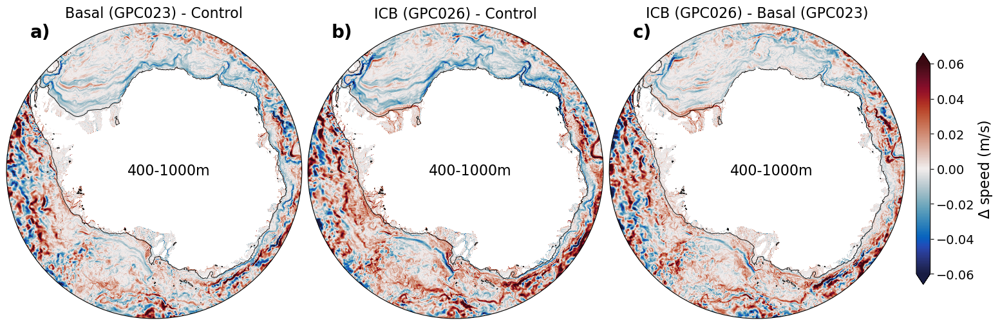

In [78]:
fig, axes = figure_spd_zrange(z_range,spd_TGade_minus_cntl,spd_TGadeICB_minus_cntl, spd_TGadeICB_minus_TGade)


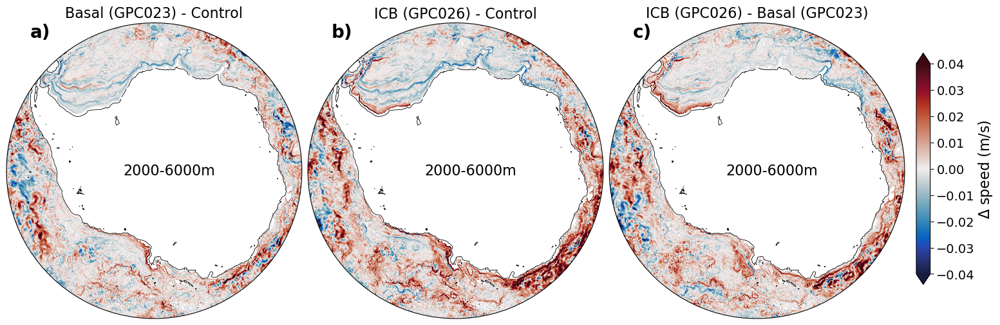

In [87]:
fig, axes = figure_spd_zrange(z_range,spd_TGade_minus_cntl,spd_TGadeICB_minus_cntl, spd_TGadeICB_minus_TGade)

# Zonal velocity changes

In [121]:
lat_slice = slice(-80,-59)
lon_slice = slice(-280,80)
z_range=[0,200]
z_slice = slice(z_range[0],z_range[1])

In [122]:
# read in temperature and salinity variables
# control
u_cntl = cc.querying.getvar(control, 'u', master_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yu_ocean=lat_slice).sel(xu_ocean=lon_slice).sel(st_ocean=z_slice)
v_cntl = cc.querying.getvar(control, 'v', master_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yu_ocean=lat_slice).sel(xu_ocean=lon_slice).sel(st_ocean=z_slice)
dzt_cntl = cc.querying.getvar(control, 'dzt', master_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yt_ocean=lat_slice).sel(xt_ocean=lon_slice).sel(st_ocean=z_slice)

# GPC015
u_TGade = cc.querying.getvar(basal_gade, 'u', basal_melt_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yu_ocean=lat_slice).sel(xu_ocean=lon_slice).sel(st_ocean=z_slice)
v_TGade = cc.querying.getvar(basal_gade, 'v', basal_melt_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yu_ocean=lat_slice).sel(xu_ocean=lon_slice).sel(st_ocean=z_slice)
dzt_TGade = cc.querying.getvar(basal_gade, 'dzt', basal_melt_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yt_ocean=lat_slice).sel(xt_ocean=lon_slice).sel(st_ocean=z_slice)

# GPC018
u_TGadeICB = cc.querying.getvar(icb_gade, 'u', basal_melt_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yu_ocean=lat_slice).sel(xu_ocean=lon_slice).sel(st_ocean=z_slice)
v_TGadeICB = cc.querying.getvar(icb_gade, 'v', basal_melt_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yu_ocean=lat_slice).sel(xu_ocean=lon_slice).sel(st_ocean=z_slice)
dzt_TGadeICB = cc.querying.getvar(icb_gade, 'dzt', basal_melt_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yt_ocean=lat_slice).sel(xt_ocean=lon_slice).sel(st_ocean=z_slice)


#temp_cntl[0,0,:,:].plot()
#plt.show()

In [123]:
%%time
# compute depth-weighted mean u and v for control
dzt_cntl = dzt_cntl.mean(dim='time').compute()
dzt_cntl_slice = dzt_cntl.sel(st_ocean=z_slice)/dzt_cntl.sel(st_ocean=z_slice).sum(dim='st_ocean')
cntl_u_mean = (u_cntl.isel(yu_ocean=slice(0,-1)).mean(dim='time').compute() * (dzt_cntl_slice.values)).sum(dim='st_ocean')
cntl_v_mean = (v_cntl.isel(yu_ocean=slice(0,-1)).mean(dim='time').compute() * (dzt_cntl_slice.values)).sum(dim='st_ocean')
cntl_u_mean = cntl_u_mean.where(cntl_u_mean != 0., np.nan)
cntl_v_mean = cntl_v_mean.where(cntl_v_mean != 0., np.nan)


# compute depth-weighted mean u and v for Basal Gade (GPC023)
dzt_TGade = dzt_TGade.mean(dim='time').compute()
dzt_TGade_slice = dzt_TGade.sel(st_ocean=z_slice)/dzt_TGade.sel(st_ocean=z_slice).sum(dim='st_ocean')
TGade_u_mean = (u_TGade.isel(yu_ocean=slice(0,-1)).mean(dim='time').compute() * (dzt_TGade_slice.values)).sum(dim='st_ocean')
TGade_v_mean = (v_TGade.isel(yu_ocean=slice(0,-1)).mean(dim='time').compute() * (dzt_TGade_slice.values)).sum(dim='st_ocean')

# compute depth-weighted mean u and v for ICB Gade (GPC026)
dzt_TGadeICB = dzt_TGadeICB.mean(dim='time').compute()
dzt_TGadeICB_slice = dzt_TGadeICB.sel(st_ocean=z_slice)/dzt_TGadeICB.sel(st_ocean=z_slice).sum(dim='st_ocean')
TGadeICB_u_mean = (u_TGadeICB.isel(yu_ocean=slice(0,-1)).mean(dim='time').compute() * (dzt_TGadeICB_slice.values)).sum(dim='st_ocean')
TGadeICB_v_mean = (v_TGadeICB.isel(yu_ocean=slice(0,-1)).mean(dim='time').compute() * (dzt_TGadeICB_slice.values)).sum(dim='st_ocean')

# now calculate anomalies
u_TGade_anom = TGade_u_mean - cntl_u_mean
v_TGade_anom = TGade_v_mean - cntl_v_mean
u_TGadeICB_anom = TGadeICB_u_mean - cntl_u_mean
v_TGadeICB_anom = TGadeICB_v_mean - cntl_v_mean

CPU times: user 1min 7s, sys: 6 s, total: 1min 13s
Wall time: 1min 45s


In [105]:
def figure_spd_zrange(z_range,cntl_spd,anom_spd1,anom_spd2):
    plt.rcParams['font.size'] = 16
    fig,axes = plt.subplots(1,3,figsize=(18,6),subplot_kw={'projection': ccrs.SouthPolarStereo()})
    plt.subplots_adjust(wspace=0.02, hspace=0.01)
    map_elements(axes)
    vminS, vmaxS = -0.1, 0.1
    vminA, vmaxA = -0.08, 0.08
    cmapS, cmapA = 'coolwarm', cmocean.balance
    
    for i, ax in enumerate(axes.flatten()):
        ax.text(0.55, 0.5, f'{z_range[0]}-{z_range[1]}m', ha='center', va='center', transform = ax.transAxes)
    # plot control anomalies
    cb_spd = axes[0].pcolormesh(cntl_spd.xu_ocean, cntl_spd.yu_ocean, cntl_spd,
                   cmap = cmapS, vmin=vminS, vmax=vmaxS, 
                   transform = ccrs.PlateCarree())
    axes[1].pcolormesh(anom_spd1.xu_ocean, anom_spd1.yu_ocean, anom_spd1,
                   cmap = cmapA, vmin=vminA, vmax=vmaxA, 
                   transform = ccrs.PlateCarree())
    cb_anom = axes[2].pcolormesh(anom_spd2.xu_ocean, anom_spd2.yu_ocean, anom_spd2,
                   cmap = cmapA, vmin=vminA, vmax=vmaxA, 
                   transform = ccrs.PlateCarree())
    plot_colorbar(fig,[0.05, 0.2, 0.012, 0.6],cb_spd,'Zonal velocity (m/s)',)
    plot_anom_colorbar(fig,[0.91, 0.2, 0.012, 0.6],cb_anom,'$\Delta$ U (m/s)')
    
    return fig, axes

def plot_colorbar(fig,axes_loc,cb_item,label):
    cbaxes = fig.add_axes(axes_loc)
    cbar = plt.colorbar(cb_item, cax = cbaxes, orientation = 'vertical',extend = 'both', shrink=0.5)
    cbar.set_label(label,fontsize=fontsize,labelpad=2)
    cbar.ax.tick_params(labelsize=14)
    return cbar
def plot_anom_colorbar(fig,axes_loc,cb_item,label):
    cbaxes = fig.add_axes(axes_loc)
    cbar = plt.colorbar(cb_item, cax = cbaxes, orientation = 'vertical',extend = 'both', shrink=0.5)
    cbar.set_label(label,fontsize=fontsize,labelpad=2)
    cbar.ax.tick_params(labelsize=14)
    return cbar

subplot_titles = ['Control zonal velocity',
                  'Basal Gade (GPC026) - Control',
                  'ICB Gade(GPC023) - Control',]

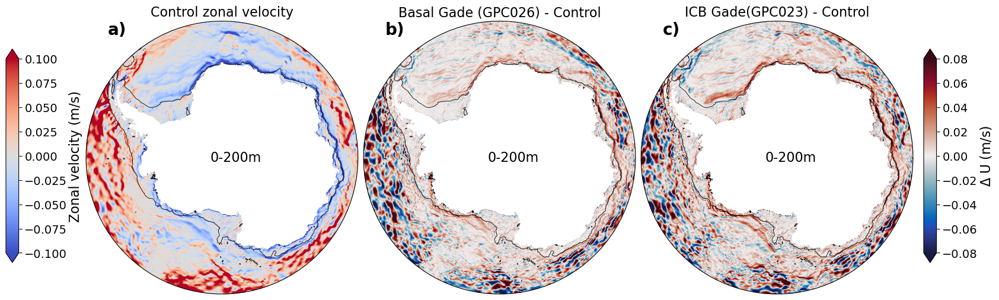

In [106]:
fig, axes = figure_spd_zrange(z_range,cntl_u_mean,u_TGade_anom,u_TGadeICB_anom)

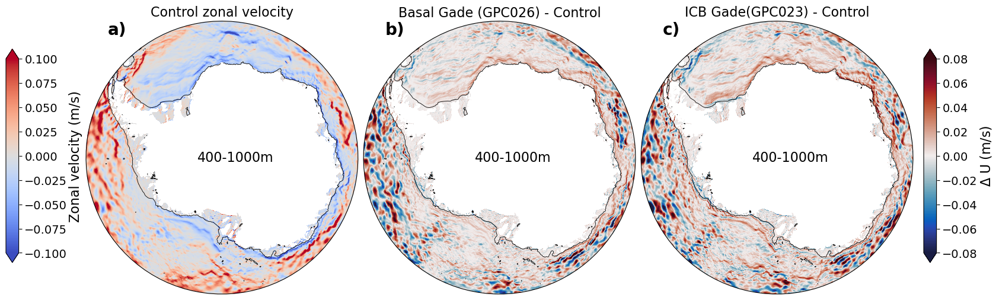

In [110]:
fig, axes = figure_spd_zrange(z_range,cntl_u_mean,u_TGade_anom,u_TGadeICB_anom)

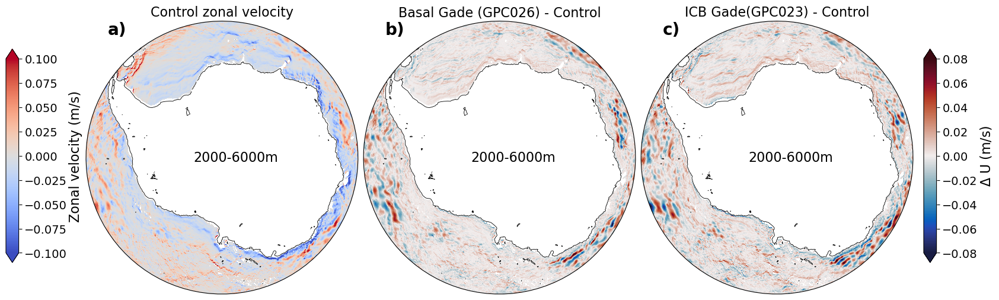

In [114]:
fig, axes = figure_spd_zrange(z_range,cntl_u_mean,u_TGade_anom,u_TGadeICB_anom)

# Meridional velocity changes

In [125]:
def figure_spd_zrange(z_range,cntl_spd,anom_spd1,anom_spd2):
    plt.rcParams['font.size'] = 16
    fig,axes = plt.subplots(1,3,figsize=(18,6),subplot_kw={'projection': ccrs.SouthPolarStereo()})
    plt.subplots_adjust(wspace=0.02, hspace=0.01)
    map_elements(axes)
    vminS, vmaxS = -0.08, 0.08
    vminA, vmaxA = -0.05, 0.05
    cmapS, cmapA = 'coolwarm', cmocean.balance
    
    for i, ax in enumerate(axes.flatten()):
        ax.text(0.55, 0.5, f'{z_range[0]}-{z_range[1]}m', ha='center', va='center', transform = ax.transAxes)
    # plot control anomalies
    cb_spd = axes[0].pcolormesh(cntl_spd.xu_ocean, cntl_spd.yu_ocean, cntl_spd,
                   cmap = cmapS, vmin=vminS, vmax=vmaxS, 
                   transform = ccrs.PlateCarree())
    axes[1].pcolormesh(anom_spd1.xu_ocean, anom_spd1.yu_ocean, anom_spd1,
                   cmap = cmapA, vmin=vminA, vmax=vmaxA, 
                   transform = ccrs.PlateCarree())
    cb_anom = axes[2].pcolormesh(anom_spd2.xu_ocean, anom_spd2.yu_ocean, anom_spd2,
                   cmap = cmapA, vmin=vminA, vmax=vmaxA, 
                   transform = ccrs.PlateCarree())
    plot_colorbar(fig,[0.05, 0.2, 0.012, 0.6],cb_spd,'Meridional velocity (m/s)',)
    plot_anom_colorbar(fig,[0.91, 0.2, 0.012, 0.6],cb_anom,'$\Delta$ V (m/s)')
    
    return fig, axes

subplot_titles = ['Control meridional velocity',
                  'Basal Gade (GPC026) - Control',
                  'ICB Gade(GPC023) - Control',]

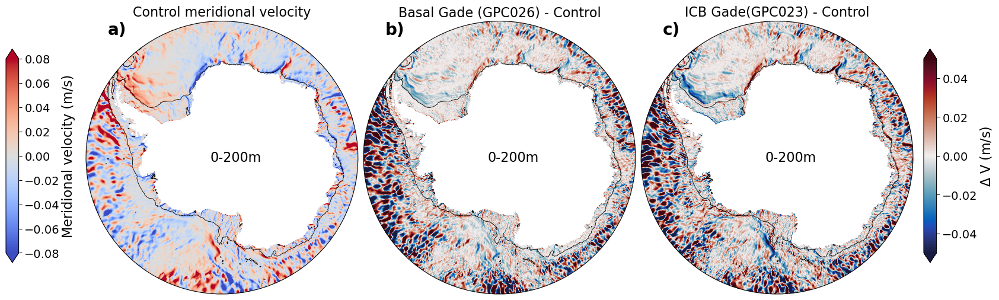

In [126]:
fig, axes = figure_spd_zrange(z_range,cntl_v_mean,v_TGade_anom,v_TGadeICB_anom)

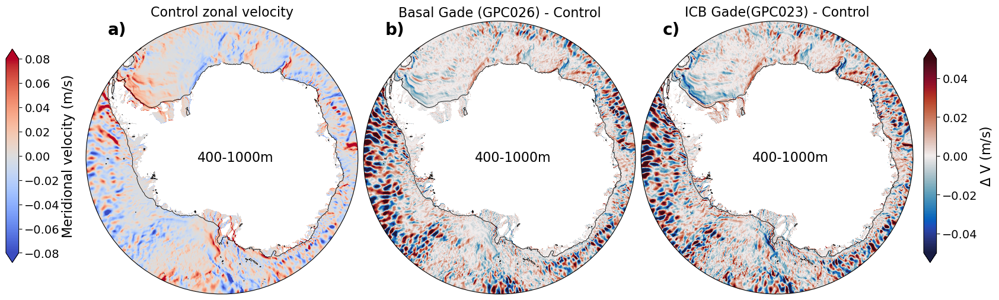

In [120]:
fig, axes = figure_spd_zrange(z_range,cntl_v_mean,v_TGade_anom,v_TGadeICB_anom)

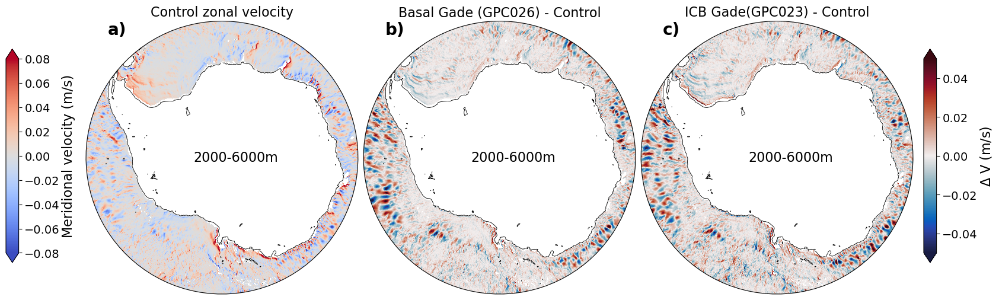

In [116]:
fig, axes = figure_spd_zrange(z_range,cntl_v_mean,v_TGade_anom,v_TGadeICB_anom)